# VinBigData Chest X-ray: Visualization [1/3]

This Jupyter Notebook is part of a series of notebooks for visualizing / Training / Testing  of  the VinBigData Chest X-ray dataset. In this notebook, we will explore various visualization techniques to gain insights into the dataset.


## Import necessary libraries


In [2]:
# Machine Learning and Data Science Imports
from skimage import exposure
from pydicom.pixel_data_handlers.util import apply_voi_lut
import pydicom
import pandas as pd; pd.options.mode.chained_assignment = None
import numpy as np
import cv2

# Built In Imports
from pathlib import Path
from glob import glob
import tqdm
import os


# Visualization Imports
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from PIL import Image
import matplotlib
from tqdm.notebook import tqdm

# PRESETS
FIG_FONT = dict(family="Helvetica, Arial", size=14, color="#7f7f7f")
num_colors = 15  # Define the number of unique colors you need
viridis_palette = sns.color_palette("viridis", num_colors)  # Using "viridis" palette
LABEL_COLORS = [px.colors.label_rgb(px.colors.convert_to_RGB_255(x)) for x in viridis_palette]

# Assuming you still want to skip a specific color, e.g., for "No Finding" class
# Skipping the 9th color as an example (adjust index as needed for your specific use case)
LABEL_COLORS_WOUT_NO_FINDING = LABEL_COLORS[:8] + LABEL_COLORS[9:]


## Define Relevant Functions 

In [3]:
def get_dicom_img_paths(directory):
    """Retrieve DICOM images file paths."""
    return list(directory.rglob("*.dicom"))

def load_data(file_path):
    """Load data from a CSV file."""
    return pd.read_csv(file_path)

def process_and_resize_img(path, size=None, keep_ratio=False, resample=Image.LANCZOS, voi_lut=True, fix_monochrome=True):
    """
    Reads a DICOM file, processes it for a human-friendly view, and optionally resizes the image.
    
    Parameters:
    - path (str): Path to the DICOM file.
    - size (int, optional): The target size to resize the largest dimension of the image. If None, resizing is skipped.
    - keep_ratio (bool, optional): If True and resizing is applied, keeps the image's original aspect ratio.
    - resample (optional): The resampling filter to use if resizing. Default is Image.LANCZOS.
    - voi_lut (bool, optional): If True, applies the Value of Interest (VOI) Look-Up Table if available to transform raw data to a human-friendly view.
    - fix_monochrome (bool, optional): If True, fixes images that appear inverted due to monochrome storage.
    
    Returns:
    - PIL.Image.Image or np.array: The processed (and optionally resized) image.
    - original_dims (tuple): The original dimensions of the image as (height, width).
    """
    try:
        dicom = pydicom.read_file(path)
    except Exception as e:
        raise IOError(f"Could not read DICOM file: {path}") from e

    original_dims = dicom.pixel_array.shape

    if voi_lut:
        data = apply_voi_lut(dicom.pixel_array, dicom)
    else:
        data = dicom.pixel_array

    if fix_monochrome and dicom.PhotometricInterpretation == "MONOCHROME1":
        data = np.amax(data) - data

    data = data - np.min(data)
    if np.max(data) != 0:
        data = data / np.max(data)
    data = (data * 255).astype(np.uint8)
    
    data_image = Image.fromarray(data)
    
    if size is not None:
        if keep_ratio:
            data_image.thumbnail((size, size), resample)
        else:
            data_image = data_image.resize((size, size), resample)
    
    return data_image, original_dims

def processed_data_DIR(load_dir, save_dir, size=None, keep_ratio=False):
    """
    Processes and resizes DICOM images in a directory, saving them in another directory.
    
    Parameters:
    - load_dir (str): Directory containing DICOM files to process.
    - save_dir (str): Directory to save processed images.
    - size (int, optional): Target size for resizing images. If None, resizing is skipped.
    - keep_ratio (bool, optional): Whether to keep the original aspect ratio when resizing.
    
    """
    os.makedirs(save_dir, exist_ok=True)
    image_id, dim_Z, dim_Y = [], [], []

    for file in tqdm(os.listdir(load_dir)):
        if not file.endswith('.dicom'):
            continue

        processed_image, original_dims = process_and_resize_img(os.path.join(load_dir, file), size=size, keep_ratio=keep_ratio)
        processed_image.save(os.path.join(save_dir, file.replace('.dicom', '.png')))
        
        image_id.append(file.replace('.dicom', ''))
        dim_Z.append(original_dims[0])  # Height
        dim_Y.append(original_dims[1])  # Width

    return pd.DataFrame({'image_id': image_id, 'dim_Z': dim_Z, 'dim_Y': dim_Y})

def plot_image(img, title="", figsize=(8, 8), cmap='gray'):
    """
    Plots an image with optional title, figure size, and colormap.
    
    Parameters:
    - img: Image data in a format compatible with plt.imshow (e.g., numpy array).
    - title (str, optional): The title of the plot. Default is an empty string.
    - figsize (tuple, optional): The size of the figure (width, height) in inches. Default is (8, 8).
    - cmap (str, optional): Colormap used for plotting the image. Default is 'gray' which is common for X-ray images.
    """
    plt.figure(figsize=figsize)
    plt.imshow(img, cmap=cmap)  # Directly use cmap with default value, works if None is passed too.
    plt.title(title, fontweight="bold")
    plt.axis('off')  # Prefer 'off' to False for clarity
    plt.show()

## Import Relevant Data

In [4]:
# Set pandas options
pd.options.mode.chained_assignment = None


# # Data Directory Setup


# Define the root data directory
DATA_DIR = Path("data")

# Define the paths to the training and testing DICOM folders respectively
TRAIN_DIR = DATA_DIR / "train"
TEST_DIR = DATA_DIR / "test"

# Check the existence of the directories
print(f"Existence of DATA Folder: {DATA_DIR.exists()}")
print(f"Existence of TRAIN Folder: {TRAIN_DIR.exists()}")
print(f"Existence of TEST Folder: {TEST_DIR.exists()}")

Existence of DATA Folder: True
Existence of TRAIN Folder: True
Existence of TEST Folder: True


## Ensuring Accurate Data Import

In [5]:
# File Paths
train_dicom_paths = get_dicom_img_paths(TRAIN_DIR)
test_dicom_paths = get_dicom_img_paths(TEST_DIR)

# Load DataFrames
train_df = load_data(DATA_DIR / "train.csv")
submission_df = load_data(DATA_DIR / "sample_submission.csv")

# Display Information
print(f"\nNumber of training files: {len(train_dicom_paths)}")
print(f"Number of testing files: {len(test_dicom_paths)}")

print("\nTraining DataFrame first 5 rows:\n")
display(train_df.head())

print("\nSample Submission DataFrame first 5 rows:\n")
display(submission_df.head())

"""# Process Images and Save Dimensions
save_dir = 'Proc_data/train/'
size = 256  # Resize to 256x256
keep_ratio = False  # Do not keep the original aspect ratio

dimensions_df = processed_data_DIR(str(TRAIN_DIR), save_dir, size=size, keep_ratio=keep_ratio)

# Save the DataFrame to a CSV file
csv_file_path = 'Proc_data/Original_Image_Dimensions.csv'
dimensions_df.to_csv(csv_file_path, index=False)
print(f'Saved image dimensions to {csv_file_path}')"""



Number of training files: 15000
Number of testing files: 3000

Training DataFrame first 5 rows:



,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN



Sample Submission DataFrame first 5 rows:



,image_id,PredictionString
0,002a34c58c5b758217ed1f584ccbcfe9,14 1 0 0 1 1
1,004f33259ee4aef671c2b95d54e4be68,14 1 0 0 1 1
2,008bdde2af2462e86fd373a445d0f4cd,14 1 0 0 1 1
3,009bc039326338823ca3aa84381f17f1,14 1 0 0 1 1
4,00a2145de1886cb9eb88869c85d74080,14 1 0 0 1 1


"# Process Images and Save Dimensions\nsave_dir = 'Proc_data/train/'\nsize = 256  # Resize to 256x256\nkeep_ratio = False  # Do not keep the original aspect ratio\n\ndimensions_df = processed_data_DIR(str(TRAIN_DIR), save_dir, size=size, keep_ratio=keep_ratio)\n\n# Save the DataFrame to a CSV file\ncsv_file_path = 'Proc_data/Original_Image_Dimensions.csv'\ndimensions_df.to_csv(csv_file_path, index=False)\nprint(f'Saved image dimensions to {csv_file_path}')"

## Correcting Monochrome Representation in X-ray Radiographs 

<PIL.Image.Image image mode=L size=2304x2880 at 0x1F89E4ED4F0>
(2880, 2304)


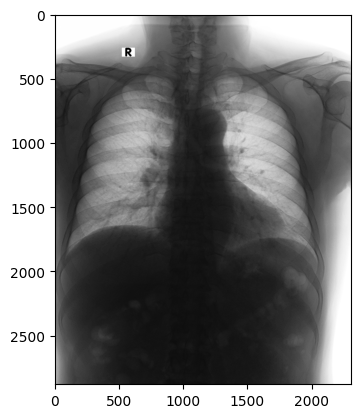

In [6]:
Img , orig_dim = process_and_resize_img('data/train/0108949daa13dc94634a7d650a05c0bb.dicom', fix_monochrome = False)
print(Img)
print(orig_dim)
plt.imshow(Img, 'gray')

<PIL.Image.Image image mode=L size=2304x2880 at 0x1F8F22B1280>
(2880, 2304)


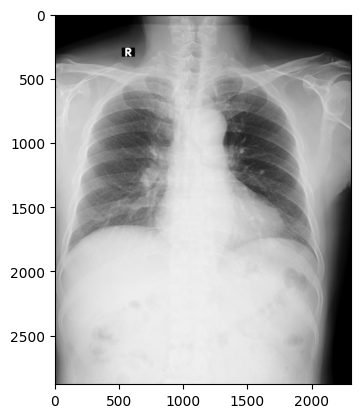

In [7]:
Img , orig_dim = process_and_resize_img('data/train/0108949daa13dc94634a7d650a05c0bb.dicom', fix_monochrome = True)
print(Img)
print(orig_dim)
plt.imshow(Img, 'gray')

## Visualization of Data Annotations and Class Distribution

In [8]:
# Count the occurrence of each class
class_counts = train_df['class_name'].value_counts().sort_index()

# Define a sequence of colors 
my_color_sequence = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = px.bar(class_counts, 
             color=class_counts.index,  # Assuming this is your categorical variable
             opacity=0.85,
             color_discrete_sequence=my_color_sequence,  # Your custom color sequence
             log_y=True,
             labels={"value": "Annotations Per Class", "index": ""},
             title="<b>Annotations Per Class</b>")

# Update layout to fit the provided example
fig.update_layout(legend_title=None,
                  title={'text': "<b>Annotations Per Class</b>", 'x': 0.5, 'xanchor': 'center'},                 
                  font=FIG_FONT,
                  xaxis_title="",
                  yaxis_title="<b>Number Of Annotations</b>",
                  width=800,
                  height=600)


# Show the figure
fig.show()

In [9]:


# Assuming you have 'class_counts' from your bar chart code
fig = px.pie(
    names=class_counts.index,
    values=class_counts.values,
    color=class_counts.index,
    color_discrete_sequence=my_color_sequence,  # Use your custom color sequence
    title="<b>Class Pie  Distribution</b>"
)

# Update the layout to display the legend and adjust other settings if needed
fig.update_layout(
    legend_title="<b>Class Names</b>",
    font=FIG_FONT
)

# Optional: Add annotations for percentages on the pie chart
fig.update_traces(textinfo='percent+label')

# Show the figure
fig.show()


In [10]:
# Assuming 'train_df' contains the 'class_id' and 'class_name' columns

# Create dictionary mappings
ID_abnormalities = {i: train_df[train_df["class_id"] == i].iloc[0]["class_name"] for i in train_df['class_id'].unique()}
abnormalities_ID = {v: k for k, v in ID_abnormalities.items()}
int_2_clr = {abnormalities_ID[k]: LABEL_COLORS[i % len(LABEL_COLORS)] for i, k in enumerate(sorted(abnormalities_ID.keys()))}

print("\n Dictionary Mapping Class Integer to each abnormalitie [ID_abnormalities]\n")
display(ID_abnormalities)

print("\n Dictionary Mapping Class abnormalitie  to each Integer [abnormalities_ID]\n")
display(abnormalities_ID)

print("\n Dictionary Mapping Class Integer to Color Representation [int_2_clr]\n")
display(int_2_clr)

# Drop the 'class_name' column as we will work with 'class_id'
print("\n Head of Train Dataframe After Dropping The Class Name Column \n")
train_df.drop(columns=["class_name"], inplace=True)
display(train_df.head(5))



 Dictionary Mapping Class Integer to each abnormalitie [ID_abnormalities]



{14: 'No finding',
 3: 'Cardiomegaly',
 0: 'Aortic enlargement',
 11: 'Pleural thickening',
 5: 'ILD',
 8: 'Nodule/Mass',
 13: 'Pulmonary fibrosis',
 7: 'Lung Opacity',
 1: 'Atelectasis',
 9: 'Other lesion',
 6: 'Infiltration',
 10: 'Pleural effusion',
 2: 'Calcification',
 4: 'Consolidation',
 12: 'Pneumothorax'}


 Dictionary Mapping Class abnormalitie  to each Integer [abnormalities_ID]



{'No finding': 14,
 'Cardiomegaly': 3,
 'Aortic enlargement': 0,
 'Pleural thickening': 11,
 'ILD': 5,
 'Nodule/Mass': 8,
 'Pulmonary fibrosis': 13,
 'Lung Opacity': 7,
 'Atelectasis': 1,
 'Other lesion': 9,
 'Infiltration': 6,
 'Pleural effusion': 10,
 'Calcification': 2,
 'Consolidation': 4,
 'Pneumothorax': 12}


 Dictionary Mapping Class Integer to Color Representation [int_2_clr]



{0: 'rgb(72, 24, 106)',
 1: 'rgb(71, 45, 123)',
 2: 'rgb(66, 64, 134)',
 3: 'rgb(59, 82, 139)',
 4: 'rgb(51, 99, 141)',
 5: 'rgb(44, 114, 142)',
 6: 'rgb(38, 130, 142)',
 7: 'rgb(33, 145, 140)',
 14: 'rgb(31, 160, 136)',
 8: 'rgb(40, 174, 128)',
 9: 'rgb(63, 188, 115)',
 10: 'rgb(94, 201, 98)',
 11: 'rgb(132, 212, 75)',
 12: 'rgb(173, 220, 48)',
 13: 'rgb(216, 226, 25)'}


 Head of Train Dataframe After Dropping The Class Name Column 



,image_id,class_id,rad_id,x_min,y_min,x_max,y_max
0,50a418190bc3fb1ef1633bf9678929b3,14,R11,NaN,NaN,NaN,NaN
1,21a10246a5ec7af151081d0cd6d65dc9,14,R7,NaN,NaN,NaN,NaN
2,9a5094b2563a1ef3ff50dc5c7ff71345,3,R10,691.0,1375.0,1653.0,1831.0
3,051132a778e61a86eb147c7c6f564dfe,0,R10,1264.0,743.0,1611.0,1019.0
4,063319de25ce7edb9b1c6b8881290140,14,R10,NaN,NaN,NaN,NaN


In [11]:
fig = go.Figure()

for i in range(15):
    # Filter the DataFrame for each class_id
    filtered_df = train_df[train_df["class_id"] == i]
    
    # Add a histogram trace for each class_id
    fig.add_trace(go.Histogram(
        x=filtered_df["rad_id"],
        marker_color=int_2_clr[i],
        name=f"<b>{ID_abnormalities[i]}</b>"  # Using bold tags for class names
    ))

# Update layout and axes
fig.update_xaxes(categoryorder="total descending")
fig.update_layout(
    title="<b>DISTRIBUTION OF ANNOTATIONS BY RADIOLOGIST</b>",
    barmode='stack',
    xaxis_title="<b>Radiologist ID</b>",
    yaxis_title="<b>Number of Annotations Made</b>",
    font=FIG_FONT,
    width=800,
    height=600  
)

# Display the figure
fig.show()

## Exploring Bounding Box Coordinate Data

In [12]:
def create_fractional_bbox_coordinates(row):
    """ Function to return bbox coordinates as fractions from DataFrame row """
    frac_x_min = row["x_min"] / row["img_width"]
    frac_x_max = row["x_max"] / row["img_width"]
    frac_y_min = row["y_min"] / row["img_height"]
    frac_y_max = row["y_max"] / row["img_height"]
    return frac_x_min, frac_x_max, frac_y_min, frac_y_max


def draw_label(img, label, tl, br, rgb, label_location):
    """ Draws label text on an image at the specified location.
    
    Args:
        img: Source image
        label: Text to draw
        tl: Tuple (x, y) of the top left corner
        br: Tuple (x, y) of the bottom right corner
        rgb: Color of the text
        label_location: Where to place the label ("tl", "br", "tr", "bl")
    
    Returns:
        img: Image with label text drawn on it
    """
    # Text settings
    FONT = cv2.FONT_HERSHEY_SIMPLEX
    FONT_SCALE = 1.666
    FONT_THICKNESS = 3
    FONT_LINE_TYPE = cv2.LINE_AA
    LABEL = label.upper().replace(" ", "_")
    
    # Calculate text size
    text_width, text_height = cv2.getTextSize(LABEL, FONT, FONT_SCALE, FONT_THICKNESS)[0]
    
    # Label position and offset
    label_origin = {"tl": tl, "br": br, "tr": (br[0], tl[1]), "bl": (tl[0], br[1])}[label_location]
    label_offset = {
        "tl": np.array([0, -10]), "br": np.array([-text_width, text_height + 10]), 
        "tr": np.array([-text_width, -10]), "bl": np.array([0, text_height + 10])
    }[label_location]
    
    # Draw text
    img = cv2.putText(img, LABEL, tuple(label_origin + label_offset), 
                      FONT, FONT_SCALE, rgb, FONT_THICKNESS, FONT_LINE_TYPE)
    return img

# Filter out 'No finding' cases
bbox_df = train_df[train_df['class_id'] != 14].copy().reset_index(drop=True)

# Load the dataset that contains image dimensions
dimensions_df = pd.read_csv('proc_data/Original_Image_Dimensions.csv')

# Create a mapping from 'image_id' to 'img_height' and 'img_width'
sizes_of_images_w_bboxes = dimensions_df.set_index('image_id')[['dim_Z', 'dim_Y']].to_dict('index')

# Apply the mapping to add 'img_height' and 'img_width' to 'bbox_df'
bbox_df['img_height'] = bbox_df['image_id'].apply(lambda x: sizes_of_images_w_bboxes[x]['dim_Z'])
bbox_df['img_width'] = bbox_df['image_id'].apply(lambda x: sizes_of_images_w_bboxes[x]['dim_Y'])

# Proceed to the next coding phases, such as creating fractional bbox coordinates
bbox_df[['frac_x_min', 'frac_x_max', 'frac_y_min', 'frac_y_max']] = bbox_df.apply(
    lambda row: create_fractional_bbox_coordinates(row), axis=1, result_type="expand"
)
bbox_df.head()

,image_id,class_id,rad_id,x_min,y_min,x_max,y_max,img_height,img_width,frac_x_min,frac_x_max,frac_y_min,frac_y_max
0,9a5094b2563a1ef3ff50dc5c7ff71345,3,R10,691.0,1375.0,1653.0,1831.0,2336,2080,0.332212,0.794712,0.588613,0.783818
1,051132a778e61a86eb147c7c6f564dfe,0,R10,1264.0,743.0,1611.0,1019.0,2880,2304,0.548611,0.699219,0.257986,0.353819
2,1c32170b4af4ce1a3030eb8167753b06,11,R9,627.0,357.0,947.0,433.0,3072,2540,0.246850,0.372835,0.116211,0.140951
3,0c7a38f293d5f5e4846aa4ca6db4daf1,5,R17,1347.0,245.0,2188.0,2169.0,2555,2285,0.589497,0.957549,0.095890,0.848924
4,47ed17dcb2cbeec15182ed335a8b5a9e,8,R9,557.0,2352.0,675.0,2484.0,3353,2568,0.216900,0.262850,0.701461,0.740829


## Heatmap Visualization of Bounding Box Annotations for Identified Abnormalities 

  0%|          | 0/36096 [00:00<?, ?it/s]

C:\Users\elkar\AppData\Local\Temp\ipykernel_29536\2570227264.py:56: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



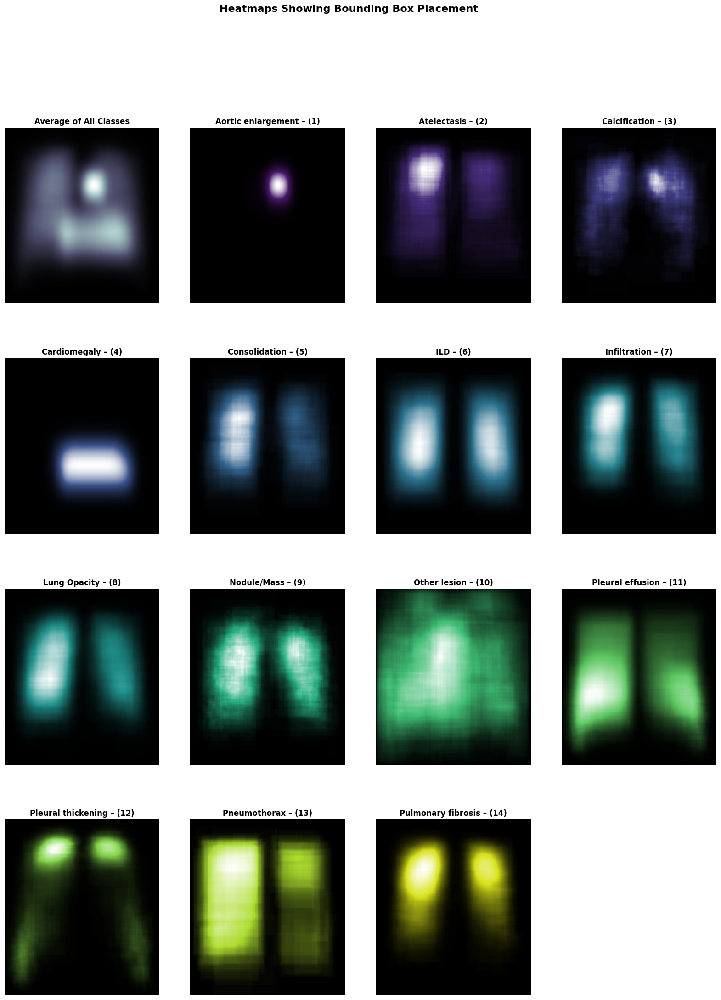

In [13]:
# Define a function to convert CSS-style 'rgb(255, 0, 0)' to matplotlib-friendly RGB format
def css_to_rgb(css_color):
    # Strip 'rgb' and parentheses, split by comma, convert to int, and then to [0, 1] range
    return tuple(int(val) / 255 for val in css_color.strip('rgb()').split(','))

# Create custom color maps for each class using the int_2_clr dictionary
custom_cmaps = {
    class_id: matplotlib.colors.LinearSegmentedColormap.from_list(
        colors=[(0, 0, 0), css_to_rgb(color), (1, 1, 1)],
        name=f"custom_class_{class_id}"
    ) for class_id, color in int_2_clr.items()
}

# Assuming class 14 corresponds to 'No finding', remove the color map for 'No finding' from the list
no_finding_class_id = 14
if no_finding_class_id in custom_cmaps:
    custom_cmaps.pop(no_finding_class_id)




# Calculate average image height and width for heatmap size
ave_src_img_height = int(bbox_df['img_height'].mean())
ave_src_img_width = int(bbox_df['img_width'].mean())

# Initialize the heatmap size based on the average dimensions
HEATMAP_SIZE = (ave_src_img_height, ave_src_img_width, len(ID_abnormalities))

# Initialize the heatmap array
heatmap = np.zeros(HEATMAP_SIZE, dtype=np.int16)

# Convert bbox coordinates from fractions to actual pixel coordinates
bbox_np = bbox_df[['class_id', 'frac_x_min', 'frac_x_max', 'frac_y_min', 'frac_y_max']].to_numpy()
bbox_np[:, 1:3] *= ave_src_img_width
bbox_np[:, 3:5] *= ave_src_img_height
bbox_np = np.floor(bbox_np).astype(np.int16)

# Populate the heatmap
for row in tqdm(bbox_np, total=bbox_np.shape[0]):
    heatmap[int(row[3]):int(row[4])+1, int(row[1]):int(row[2])+1, int(row[0])] += 1

# Plot the heatmap
fig = plt.figure(figsize=(20, 25))
plt.suptitle("Heatmaps Showing Bounding Box Placement\n", fontweight="bold", fontsize=16)

for i in range(15):
    plt.subplot(4, 4, i+1)
    if i == 0:
        plt.imshow(heatmap.mean(axis=-1), cmap="bone")
        plt.title("Average of All Classes", fontweight="bold")
    else:
        plt.imshow(heatmap[:, :, i-1], cmap=custom_cmaps[i-1])
        plt.title(f"{ID_abnormalities[i-1]} – ({i})", fontweight="bold")
    plt.axis('off')

fig.tight_layout(rect=[0, 0.07, 1, 0.1])
plt.show()

In [14]:
# Update the bounding box DataFrame to include the fractional area of the bounding boxes
bbox_df["frac_bbox_area"] = (bbox_df["frac_x_max"] - bbox_df["frac_x_min"]) * (bbox_df["frac_y_max"] - bbox_df["frac_y_min"])

# Map class IDs to string representations for better readability in the plot
bbox_df["class_id_as_str"] = bbox_df["class_id"].map(ID_abnormalities)
display(bbox_df.head())

# Create a box plot using Plotly Express
import plotly.express as px

fig = px.box(bbox_df.sort_values(by="class_id_as_str"), 
             x="class_id_as_str", 
             y="frac_bbox_area", 
             color="class_id_as_str", 
             color_discrete_sequence=LABEL_COLORS_WOUT_NO_FINDING, 
             notched=True,
             labels={"class_id_as_str": "Class Name", "frac_bbox_area": "BBox Area (%)"}, 
             title="<b>DISTRIBUTION OF BBOX AREAS AS % OF SOURCE IMAGE AREA " \
                   "<i><sub>(Some Upper Outliers Excluded For Better Visualization)</sub></i></b>")

# Update layout
fig.update_layout(
    showlegend=True,
    yaxis_range=[-0.025, 0.4],  # Adjust the y-axis range to focus on a specific area if necessary
    legend_title_text=None,
    xaxis_title="",
    yaxis_title="<b>Bounding Box Area %</b>",
    font=FIG_FONT,  # Ensure FIG_FONT is defined with your desired font settings
    width=800,
    height=600
)

# Show the box plot
fig.show()


,image_id,class_id,rad_id,x_min,y_min,x_max,y_max,img_height,img_width,frac_x_min,frac_x_max,frac_y_min,frac_y_max,frac_bbox_area,class_id_as_str
0,9a5094b2563a1ef3ff50dc5c7ff71345,3,R10,691.0,1375.0,1653.0,1831.0,2336,2080,0.332212,0.794712,0.588613,0.783818,0.090283,Cardiomegaly
1,051132a778e61a86eb147c7c6f564dfe,0,R10,1264.0,743.0,1611.0,1019.0,2880,2304,0.548611,0.699219,0.257986,0.353819,0.014433,Aortic enlargement
2,1c32170b4af4ce1a3030eb8167753b06,11,R9,627.0,357.0,947.0,433.0,3072,2540,0.246850,0.372835,0.116211,0.140951,0.003117,Pleural thickening
3,0c7a38f293d5f5e4846aa4ca6db4daf1,5,R17,1347.0,245.0,2188.0,2169.0,2555,2285,0.589497,0.957549,0.095890,0.848924,0.277156,ILD
4,47ed17dcb2cbeec15182ed335a8b5a9e,8,R9,557.0,2352.0,675.0,2484.0,3353,2568,0.216900,0.262850,0.701461,0.740829,0.001809,Nodule/Mass


## Visualizing BBOX Images by IDs 

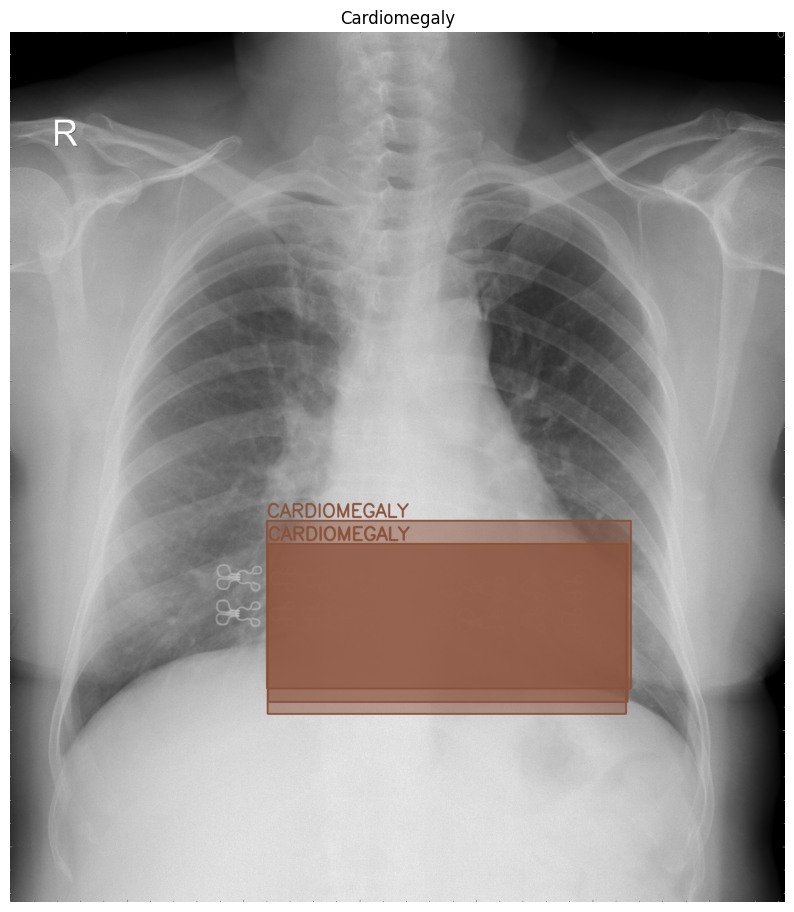

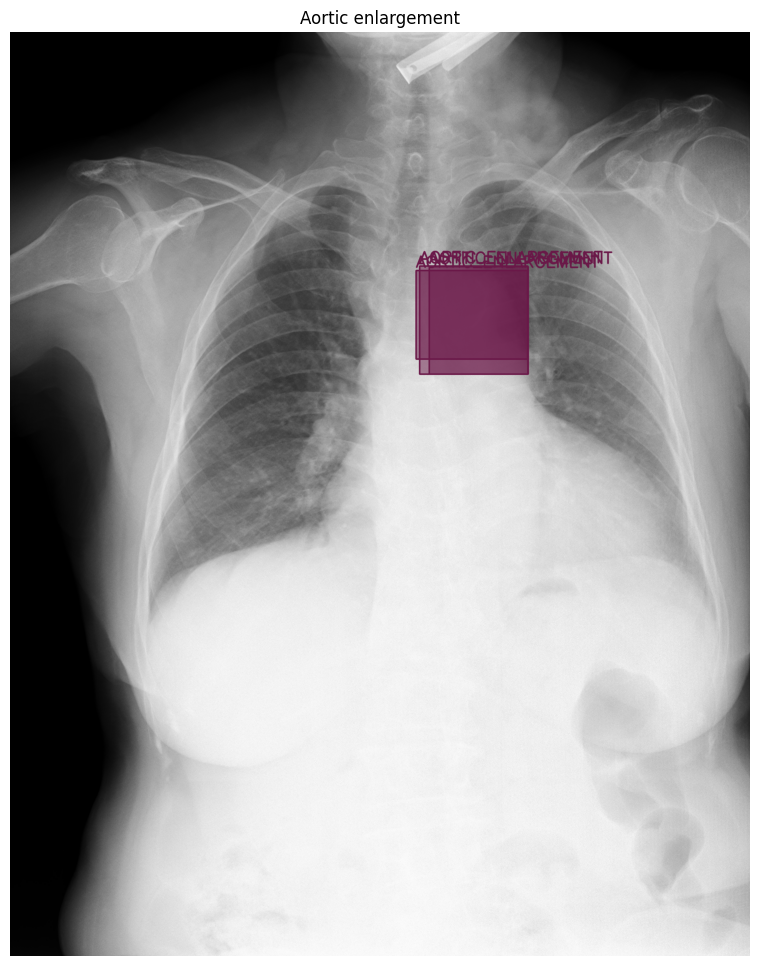

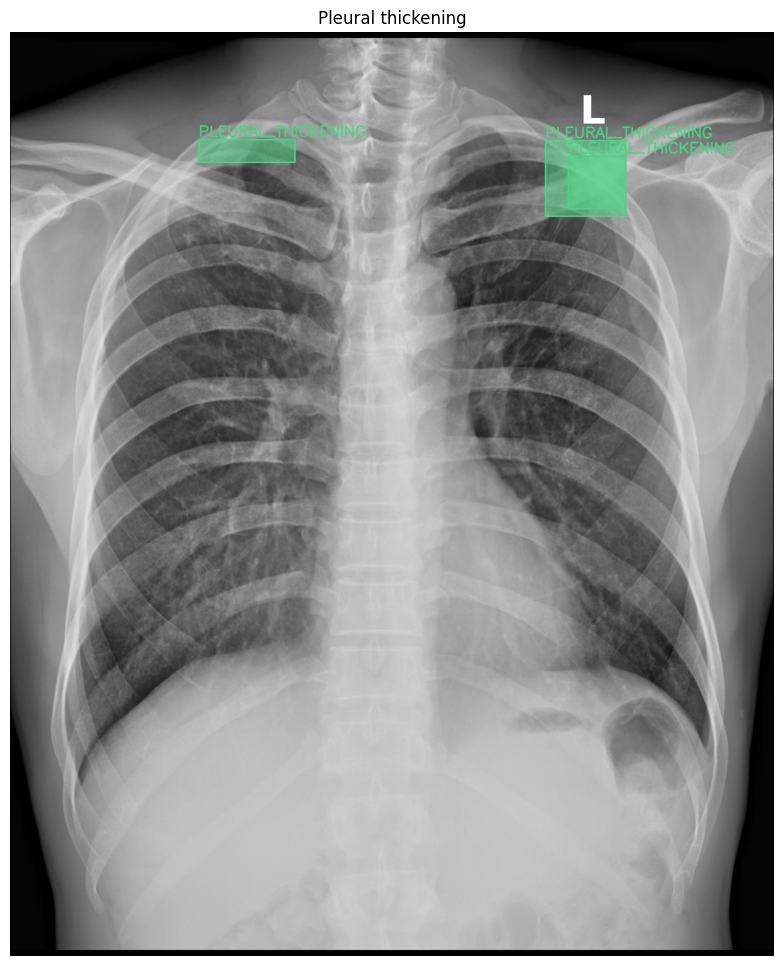

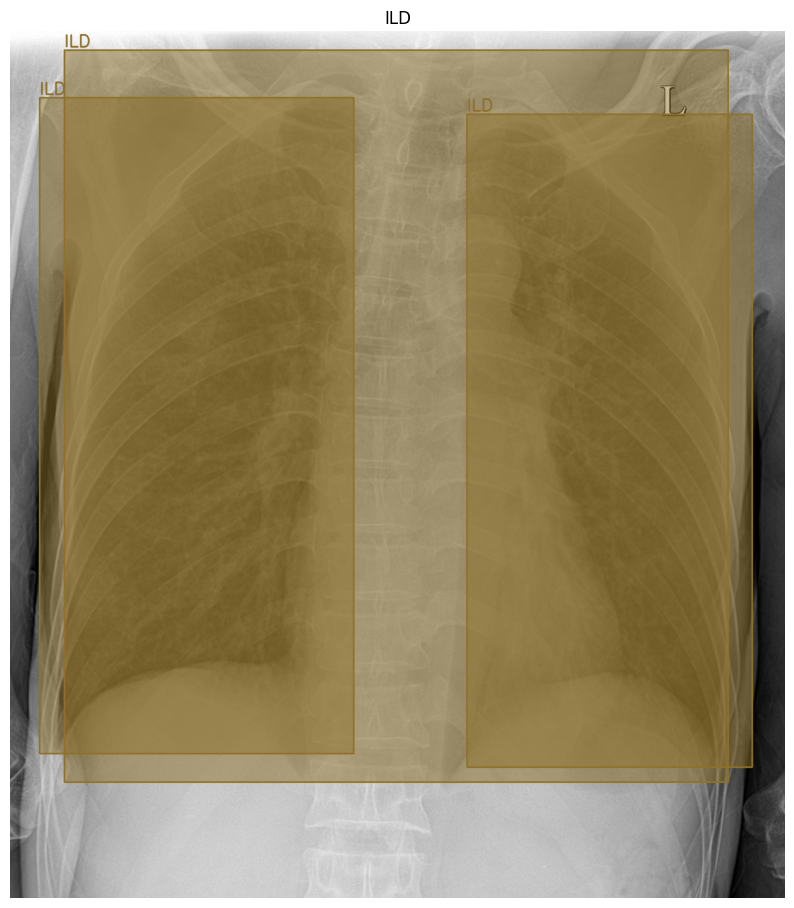

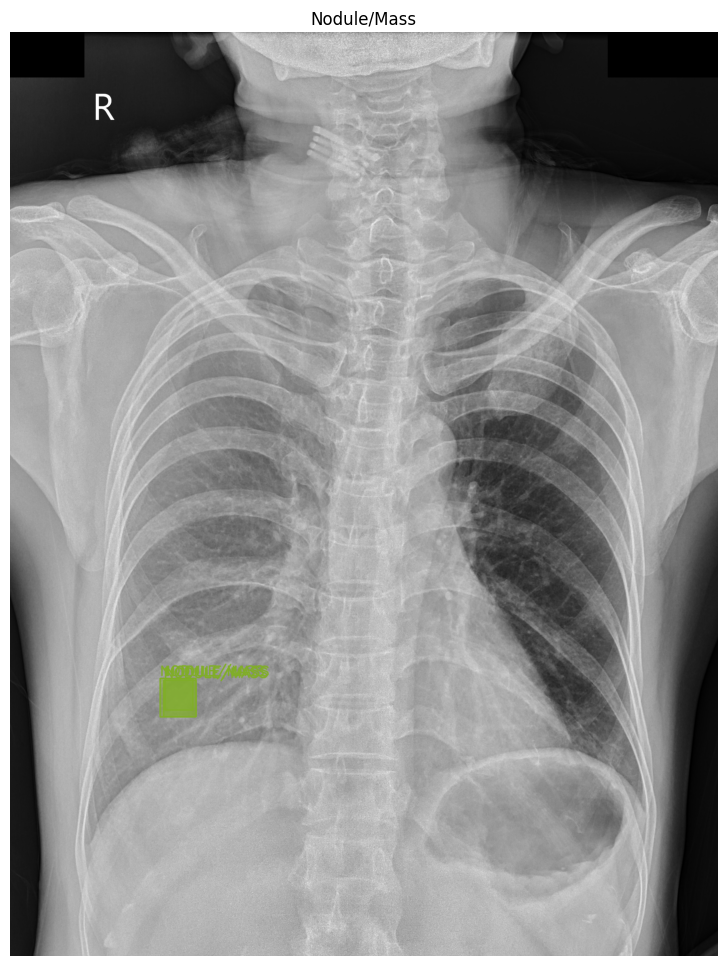

...

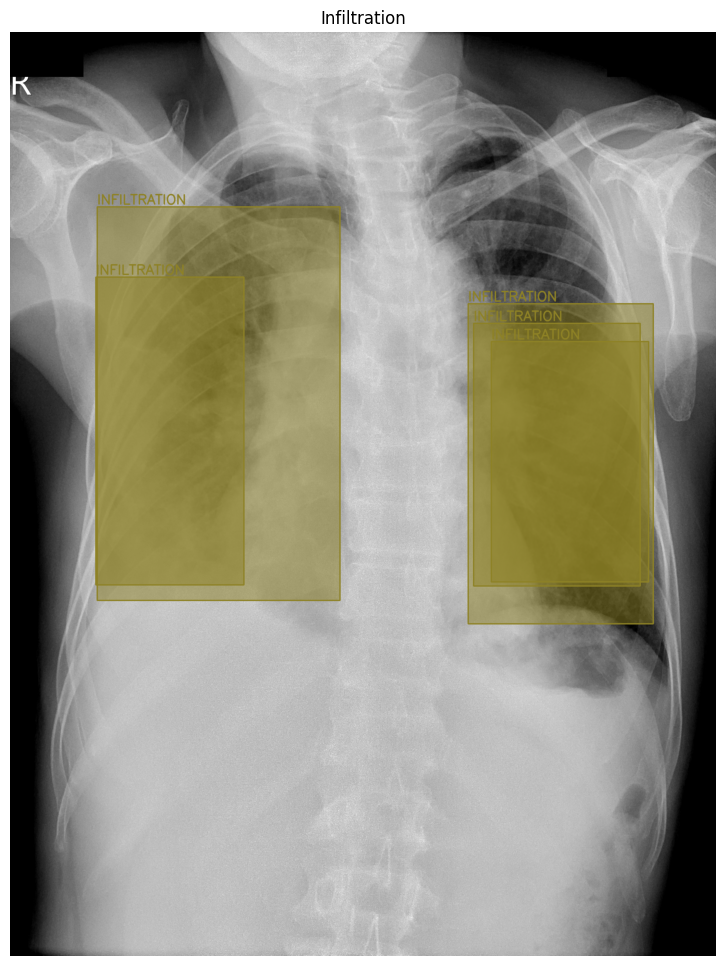

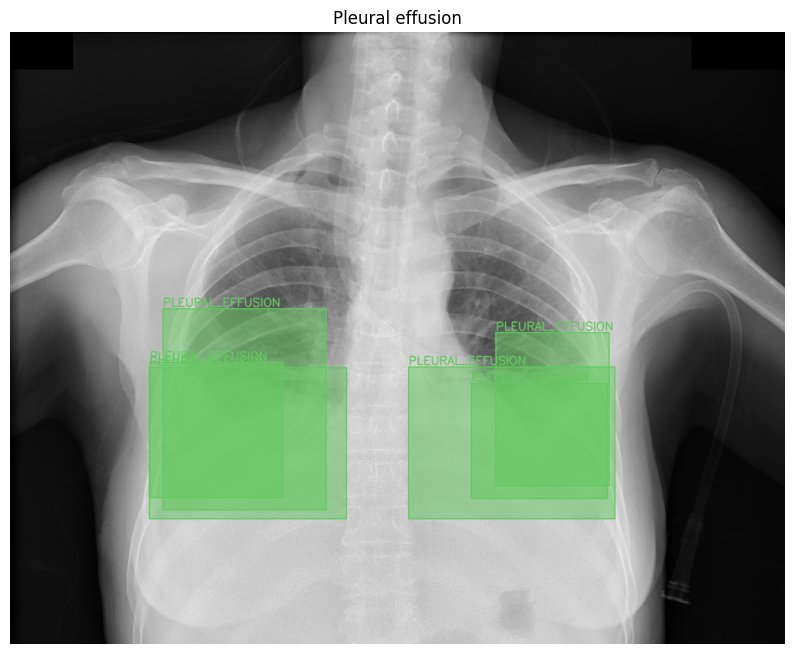

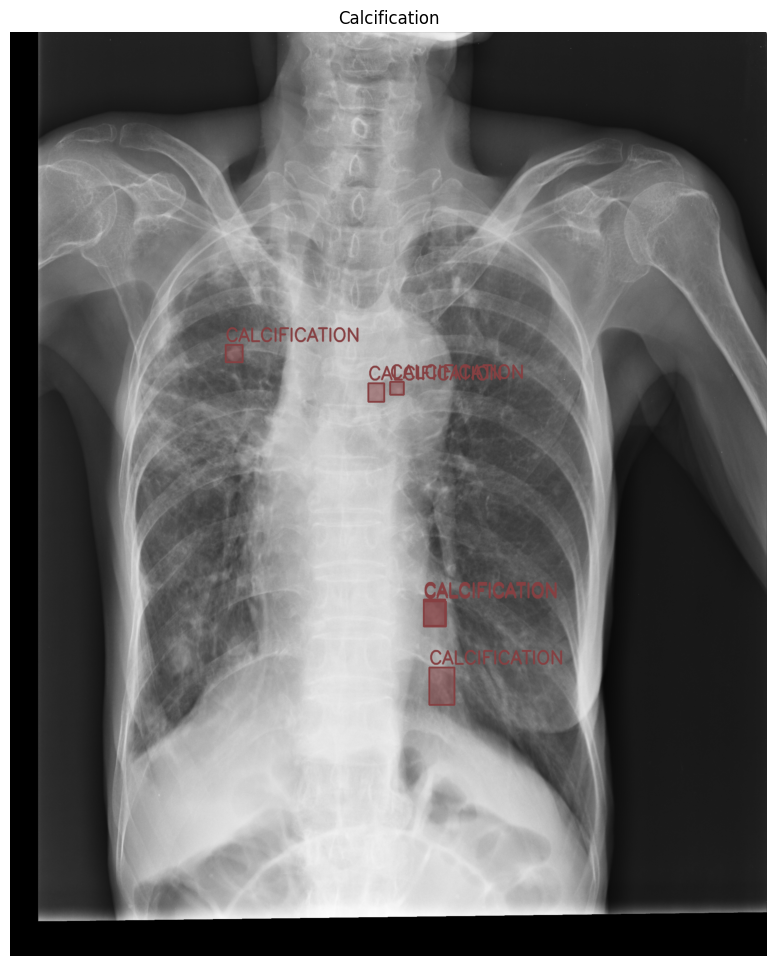

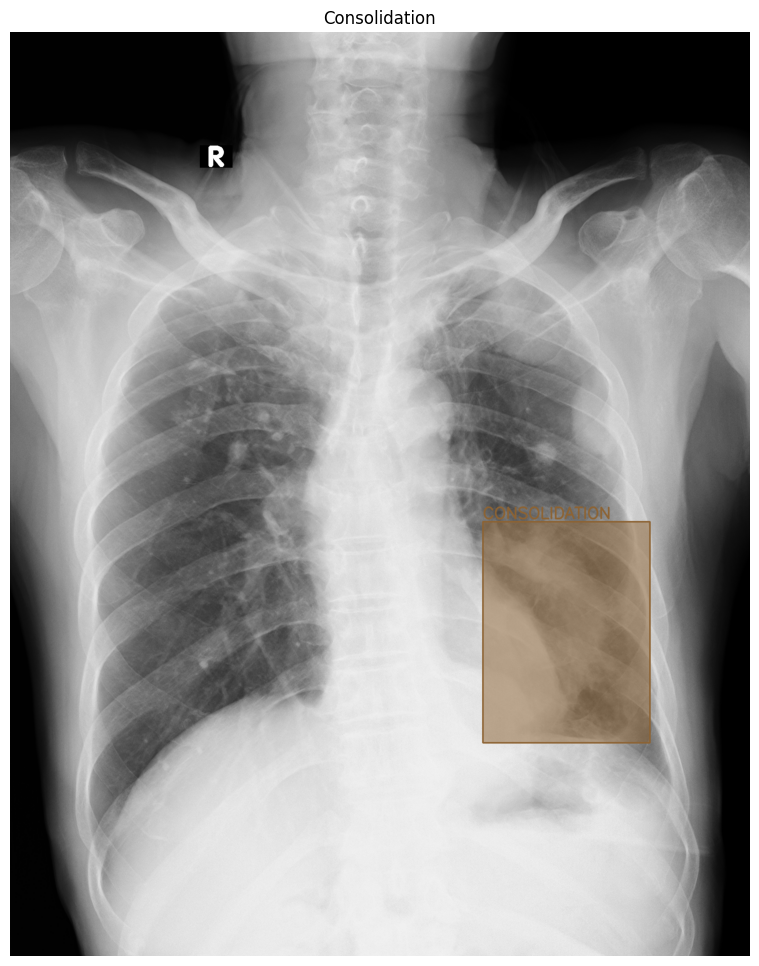

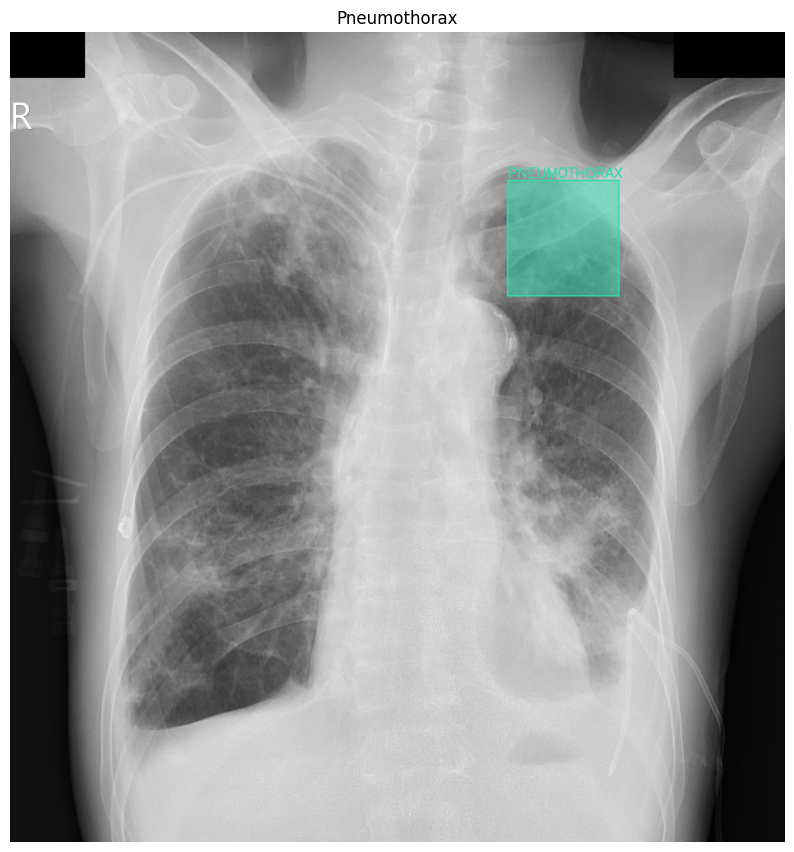

In [23]:
def draw_bboxes(img, tl, br, css_rgb, label="", label_location="tl", opacity=0.5, line_thickness=3):
    """
    Draws a bounding box on an image using CSS-style RGB color.

    Args:
        img: Source image in BGR format.
        tl: Top left corner of the bounding box (x, y).
        br: Bottom right corner of the bounding box (x, y).
        css_rgb: Color of the bounding box in CSS-style RGB format ('rgb(r, g, b)').
        label: Optional label for the bounding box.
        label_location: Location of the label relative to the bounding box ('tl', 'br', 'tr', 'bl').
        opacity: Opacity of the bounding box fill (0 to 1).
        line_thickness: Thickness of the bounding box border line.

    Returns:
        The source image with the bounding box drawn on it.
    """
    # Convert CSS RGB string to RGB tuple using your existing function
    rgb_tuple = css_to_rgb(css_rgb)
    
    # Convert RGB tuple to BGR tuple for OpenCV
    bgr_tuple = tuple(reversed(rgb_tuple))

    # Scale RGB values to 0-255 range as expected by OpenCV
    bgr_tuple_scaled = tuple(int(val * 255) for val in bgr_tuple)
    
    overlay = img.copy()
    cv2.rectangle(overlay, tuple(tl), tuple(br), bgr_tuple_scaled, -1)  # Fill the rectangle
    cv2.addWeighted(overlay, opacity, img, 1 - opacity, 0, img)

    # Draw the border
    cv2.rectangle(img, tuple(tl), tuple(br), bgr_tuple_scaled, line_thickness)

    # Add the label, if provided
    if label:
        img = draw_label(img, label, tl, br, bgr_tuple_scaled, label_location)

    return img



for class_id in bbox_df['class_id'].unique():
    example_image_id = bbox_df[bbox_df['class_id'] == class_id]['image_id'].iloc[0]
    image_path = os.path.join(TRAIN_DIR, f"{example_image_id}.dicom")  # Ensure the path is correct
    image, original_dims = process_and_resize_img(image_path)  # Adjust function name if necessary
    image_rgb = cv2.cvtColor(np.array(image), cv2.COLOR_GRAY2RGB)  # Ensure the image is in RGB
    
    annotations = bbox_df[(bbox_df['image_id'] == example_image_id) & (bbox_df['class_id'] == class_id)]
    
    for _, row in annotations.iterrows():
        tl = (int(row['frac_x_min'] * row['img_width']), int(row['frac_y_min'] * row['img_height']))
        br = (int(row['frac_x_max'] * row['img_width']), int(row['frac_y_max'] * row['img_height']))
        rgb = int_2_clr[class_id]  # Ensure this is an RGB tuple; adjust if necessary
        label = ID_abnormalities[class_id]
        
        image_rgb = draw_bboxes(image_rgb, tl, br, rgb, label)
    
    plt.figure(figsize=(10, 12))
    plt.imshow(image_rgb)  # Directly display RGB image without converting back to BGR
    plt.title(label)
    plt.axis('off')
    plt.show()